# Absolute Flux Calibration for IGRINS data

In this tutorial, we will use the python packages [muler](https://github.com/OttoStruve/muler) and [gollum](https://github.com/BrownDwarf/gollum/) to emperically absolute flux calibrate and telluric correct a stellar spectrum using an associated A0V standard star spectrum observed with IGRINS.  Here we will calibrate the G2 star SU Aur using the standard A0V star HR 1237. Both were observed from the 2.7 m telescope at McDonald Observatory at similar airmass on the night of 20141122.   

Before you get started, make sure you have installed muler and gollum:
* Install the developer version of muler: https://muler.readthedocs.io/en/latest/install.html
* Install gollum: https://gollum-astro.readthedocs.io/en/latest/install.html

Once you have muler and gollum installed, there is one of two ways you can proceed with this tutorial.  You can try reducing the example data yourself and reading it in using the convenience function `readPLP`, or if you want to get started quickly you can use the existing example data. 

## Reduce the data with the IGRINS PLP and import it using `readPLP`

* Install the IGRINS PLP v3 (or above): https://github.com/igrins/plp/wiki/How-to-Install
* Download the raw data from  for the night 20141122.
   * The raw data is publically availiable in the [RRISA](https://igrinscontact.github.io) Raw Box folder: https://utexas.app.box.com/s/w3i7rya83lmgkiqkg79w85b7wrra90m5/folder/179762791640)
   * Place all the raw data in the `PLP/indata/20141122` directory.
* Prepare the recipe log by copy and pasting the text below into `PLP/recipe_logs/20141122.recipes`.  For more info, see instructions on how to prepare recipe logs: https://github.com/igrins/plp/wiki/How-to-prepare-recipe-logs
```
OBJNAME, OBJTYPE, GROUP1, GROUP2, EXPTIME, RECIPE, OBSIDS, FRAMETYPES
# Avaiable recipes : FLAT, THAR, SKY, A0V_AB, A0V_ONOFF, STELLAR_AB, STELLAR_ONOFF, EXTENDED_AB, EXTENDED_ONOFF
Cals, FLAT, 1, 1, 30.000000, FLAT, 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32, OFF OFF OFF OFF OFF OFF > OFF OFF OFF OFF ON ON ON ON ON ON ON ON ON ON
SKY, SKY, 1, 1, 300.000000, SKY, 47, A
HR 1237, STD, 1, 1, 60.000000, A0V_AB, 101 102 103 104 105 106 107 108, A B B A A B B A
SUAur, TAR, 1, 1, 60.000000, STELLAR_AB, 117 118 119 120 121 122 123 124, A B B A A B B A
```

* Run the `run.sh` script in the `PLP` directory.  It will ask for the UT Date which will be `20141122`.
  * You might need to give it execute permissions:
  `chmod +x run.sh`.  
   * For more info, see instructions on how to run the IGRINS PLP: https://github.com/igrins/plp/wiki/How-to-run-pipeline
*  Data reduction products will be generated
   *  The `PLP/outdata/20141122` directory including the various .spec.fits, .variance.fits, and .spec2d.fits files for frame numbers 0117 (SU Aur) and 0101 (HR 1237) for both the both H and K bands.
   * The `PLP/calib/primary/20141122` directory includes the wvlsol_v1.fits files which store the wavelength solution from the sky lines (frame number 0047).

Once the 20141122 data are reduced, muler provides the convenience function `readPLP` for reading in the reduced data from the PLP directory.  It combines both the H and K bands into a single `IGRINSSpectrumList` object.

In [1]:
from muler.igrins import readPLP

plp_path = '/Users/kk25239/Desktop/PLP/' #Directory to the IGRINS PLP (modify to match your PLP directory path)
date = 20141122 #Night of observations in YYYYMMDD format
target_frameno = 117 #Frame number for the science target SU Aur
std_frameno = 101 #Frame number for the A0V standard star HR 1237
wave_frameno = 47 #Frame number for the sky exposure used in the wavelength solution
dim = '1D' #Whether to use the 1D or 2D spectrum.  Since the target and standard are both stars, we will use 1D

sci_spec = readPLP(plp_path, date, target_frameno, wave_frameno, dim=dim)
std_spec = readPLP(plp_path, date, std_frameno, wave_frameno, dim=dim)

## OR use the provided example data and manually import each file

You could first reduce 20141122 using the IGRINS PLP v3 (or above) and import them using `IGRINSSpectrumList.read()`

This tutorial will use .spec.fits, .variance.fits, and .spec2d.fits files from frame numbers 0117 (SU Aur) and 0101 (HR 1237) and we will combine both H and K bands.  First here we will read in the 1D spectra from each star.  In the IGRINS PLP output, they all come from  `plp/outdata/20141122/`.  We use the wavelength solution from the sky lines (frame number 0118) which is from  the PLP calibration output directory `plp/calib/primary/20141023/`.  Here we will read in these files that are provided in the muler example data.  You might need to modify `data_path` below depending on where you downloaded the example data.

We will use `IGRINSSpectrumList.read()` to read in each .spec.fits file while also providing the corresponding wavelength solution wvlsol_v1.fits file.  `IGRINSSpectrumList.read()` will automatically find and read in the corrisponding .variance.fits files for uncertainity propogation.  The H and K bands will be read in seperately and combined later.

In [2]:
from muler.igrins import IGRINSSpectrumList
import numpy as np

data_path = '../../data/muler_example_data/IGRINS/04_IGRINS_test_data/'
sci_spec_H = IGRINSSpectrumList.read(data_path+'SDCH_20141122_0117.spec.fits', wavefile=data_path+'SKY_SDCH_20141122_0047.wvlsol_v1.fits')
sci_spec_K = IGRINSSpectrumList.read(data_path+'SDCK_20141122_0117.spec.fits', wavefile=data_path+'SKY_SDCK_20141122_0047.wvlsol_v1.fits')
std_spec_H = IGRINSSpectrumList.read(data_path+'SDCH_20141122_0101.spec.fits', wavefile=data_path+'SKY_SDCH_20141122_0047.wvlsol_v1.fits')
std_spec_K = IGRINSSpectrumList.read(data_path+'SDCK_20141122_0101.spec.fits', wavefile=data_path+'SKY_SDCK_20141122_0047.wvlsol_v1.fits')

Now we will combine the H and K bands into one `IGRINSSpectrumList` objects for each star using `contantenate_orders`.

In [3]:
from muler.utilities import concatenate_orders

sci_spec = concatenate_orders(sci_spec_H, sci_spec_K)
std_spec = concatenate_orders(std_spec_H, std_spec_K)

IGRINS data can be read in either manually with `IGRINSSpectrumList.read` or the convenience function `readPLP` as shown above.  In practice, it is typically easier to use `readPLP` to read in data you have reduced yourself.

## View the unprocessed data

Let us see what the spectrum for SU Aur and HR 1237 look like before we do any processing.  You can see the blaze function for each order.    As you can see, they look almost the same and are mostly featureles except for telluric absorption lines, since G2 and A0V stars are realtively featureless in the NIR H and K bands.  Later we will use the spectrum of the standard star HR 1237 to emperically absolute flux calibrate and telluric correct SU Aur.

Text(0.5, 1.0, 'HR 1237 Unprocessed')

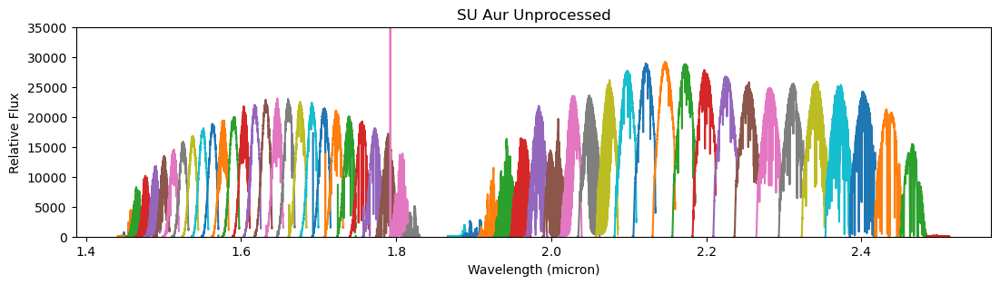

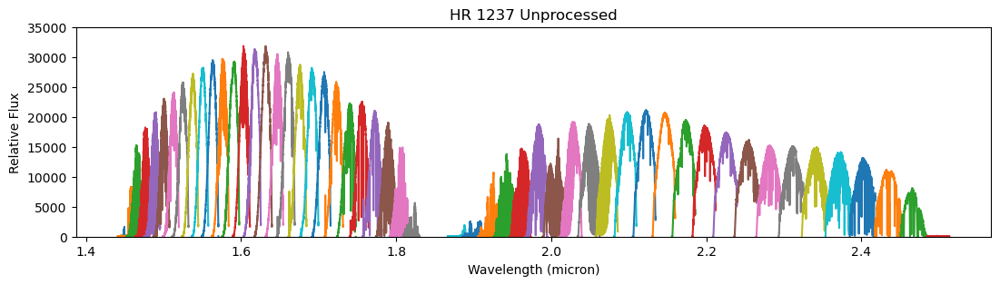

In [4]:
from matplotlib import pyplot as plt

plt.figure(figsize=[13, 3])
for order in sci_spec:
    plt.plot(order.spectral_axis.micron, order.flux)
plt.ylim([0, 35000])
plt.xlabel('Wavelength (micron)')
plt.ylabel('Relative Flux')
plt.title('SU Aur Unprocessed')

plt.figure(figsize=[13, 3])
for order in std_spec:
    plt.plot(order.spectral_axis.micron, order.flux)
plt.ylim([0, 35000])
plt.xlabel('Wavelength (micron)')
plt.ylabel('Relative Flux')
plt.title('HR 1237 Unprocessed')

## Estimate slit throughput

**IGRINS was not origionally designed for precise spectrophotometry, and does not collect all light from observed targets.  An observed star's point-spread-function (PSF) will always have wings that fall outside the slit width, so some light is always lost at the edges of the slit.  The fraction of light through the slit, or slit throughput, is wavelength dependent since the seeing FWHM is inversely proportional to wavelength.  IGRINS has a large spectral grasp (large range of wavelengths covered) so to get an accurate flux calibraiton, we need to estimate the wavelength dependent slit thoughput.  I will discuss several possible methods below, and then walk through the reccomended procedure.**


Possible methods to estimate wavelength-dependent slit throughput:
* Assume the target and associated standard star are observed at the same airmass, with the same seeing, and same telescope tracking.  The wavelength dependent slit throughput gets calibrated out when the target spectrum is divided by the spectrum of the standard star during the later steps of the flux calibraiton process.  This is the simplest solution and requires no extra work, but you must be sure your assumptions are correct.
* Take images with the IGRINS Slit-view-camera (SVC) throughout the observation and at least one image of the target star off the slit.  Compare the total counts of the star on and off the slit in the SVC images to estimate the slit throughput.  This has the advantage of being a method independent of the spectrum, but only measures a flux weighted average in the K-band and does not give a measurement of the wavelength dependence.
* Estimate the FWHM of a star's PSF based on the profile of the PSF along the slit in the 2D spectrum itself.  Project the measured PSF along the sit into 2D and mask it to estimate the throughput.  This method assumes radial symmetry of the PSF.  The main advantage here is we get a direct estimate of the wavelength dependence.  The main disadvantage is that the profile of the star along the slit in the 2D spectrum can get blurred by the optics of the spectrometer defocusing the beam of light after it has passed through the slit but before the beam falls on the detector.  This is especially a problem in the H-band beteween 2014-2020, and the K-band between 2018-2020.  For observations taken after 2020, IGRINS was refocused so this was no longer an issue.  Despite these issues, this is the reccomended method for estimating slit thorughput.  We will walk through the steps how this works below.

First we will step through and visualize how exactly this works using the standard star.  We will read in the standard star in 2D using `IGRINSSpectrumList.read()` but the `readPLP()` can also be used with `dim='2D'`:


In [5]:
std_2D_spec_H = IGRINSSpectrumList.read(data_path+'SDCH_20141122_0101.spec2d.fits', wavefile=data_path+'SKY_SDCH_20141122_0047.wvlsol_v1.fits')
std_2D_spec_K = IGRINSSpectrumList.read(data_path+'SDCK_20141122_0101.spec2d.fits', wavefile=data_path+'SKY_SDCK_20141122_0047.wvlsol_v1.fits')
std_2D_spec = concatenate_orders(std_2D_spec_H, std_2D_spec_K)

Now we have loaded the 2D spectrum of the standard star, let us look at what a single order looks like.  The bright and dark horizontal bands are the A and B nods along the slit.  The B nod is negative because the PLP subtracts the B nods from the A nods.  The white rectangles you see peppering the image are masked bad pixels or cosmic rays.  The horizontal stripes you see through the A and B nod traces are narrow telluric absorption lines.

Text(0, 0.5, 'Position along slit')

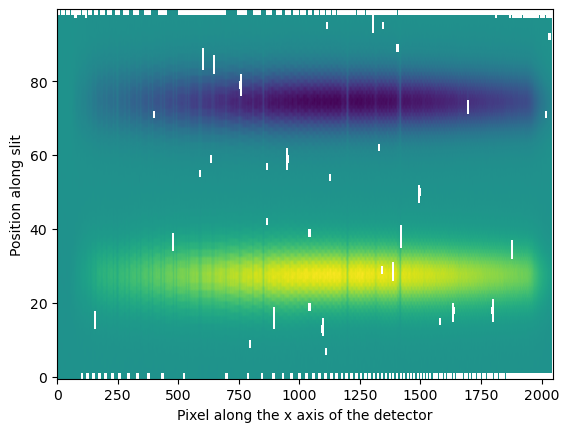

In [6]:
order = 39

plt.imshow(std_2D_spec[order].flux.value, origin='lower', aspect='auto')
plt.xlabel('Pixel along the x axis of the detector')
plt.ylabel('Position along slit')

Now we will normalize the 2D spectrum by the total absolute value of the counts in a column along the detector.  This removes the instrumental response and "flattens" the continuum so we can later get the profile of the star along the slit in almost any column and order.  As you can see, the result looks very smooth.  We have drawn a line where we will extract a vertical slice of the spectrum for getting the star's profile along the slit.

Text(0, 0.5, 'Position along slit')

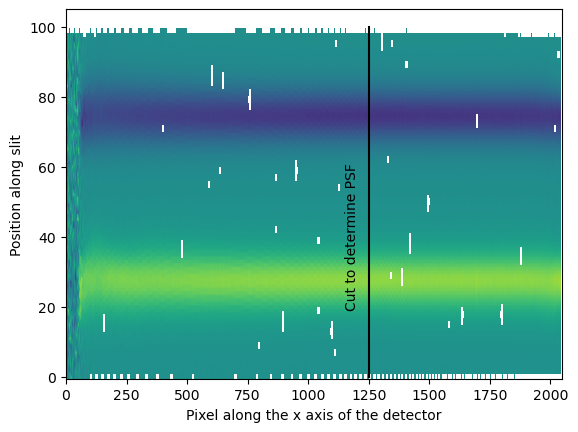

In [7]:
norm_std_2D_spec = (std_2D_spec / std_2D_spec.apply(np.abs).apply(np.nansum, axis=0))

plt.imshow(norm_std_2D_spec[order].flux.value, origin='lower', vmin=-.05, vmax=.05, aspect='auto')
plt.plot([1250, 1250], [0, 100], color='black')
plt.text(1150, 20, 'Cut to determine PSF', rotation=90)
plt.xlabel('Pixel along the x axis of the detector')
plt.ylabel('Position along slit')

We have found that the focus of the beam on the detector is best at about 1250 pixels in both the H and K badns.  This same result was found in Figure 4 of the IGRINS RV paper [Stahl et al. (2021)](https://ui.adsabs.harvard.edu/abs/2021AJ....161..283S/abstract) where they measured the instrumental profile in the dispersion direction across each detector.  This is where we want to extract our stellar PSF since it best represents the "true" PSF of the star on the slit.  We will horizontally median collapse 100 pixels centered on the 1250th column to estimate the profile (PSF) of the star across are slit on both the A and B nods, and plot the result.  As you can see, the A and B nods appear as almost symmetric mirrored profiles.

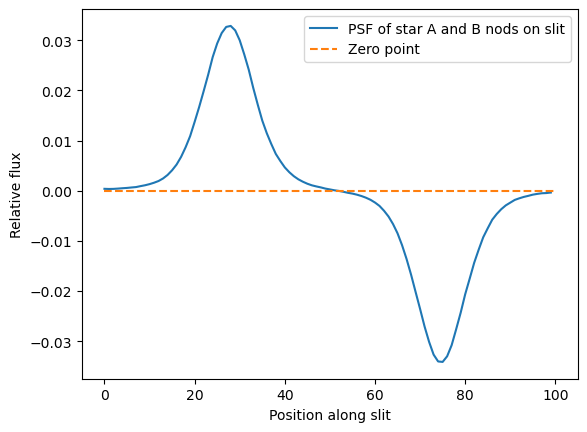

In [8]:
y = np.nanmedian(norm_std_2D_spec[order].flux[:,1200:1300], axis=1)

plt.plot(y, label='PSF of star A and B nods on slit')
plt.plot([0, 100], [0,0], '--', label='Zero point')
plt.xlabel('Position along slit')
plt.ylabel('Relative flux')
plt.legend()

In order to project these profiles into 2D, we must fit.  [Moffat distributions](https://en.wikipedia.org/wiki/Moffat_distribution) are commonly used to fit stellar PSFs in images.  It turns out they also provide the best fit to the PSF of each nod along the slit here.  The `Slit` class in the muler utilities library is designed to handle this.  Here we will create a `Slit` object and use it to fit Moffat profiles using the `ABBA()` method.  Note that we must give the Slit object various parameters about the slit size and observations.  These observations were taken on the 2.7 m telescope at McDonald Obervatory so the slit was 14.8"x1".  We assume the position angle (PA) was East-west or 90 degrees and that the telescope guiding error was 1 arcsec.  We will print the FWHM of the fits and plot the result.  You can see that a Moffat distribution fits very well.  Now we assume the profiles are radially symmetric and project the Moffat distribution fits into 2D and draw a mask around them the size of the IGRINS slit to estimate the throughput.  We the plot the slit projection in to 2D with `slit.plot2d()`  The white rectangle represents the mask for the IGRINS slit.  Using `slit.estimate_slit_throughput()`, we estimate the slit throughput from the projected 2D profiles by summing the flux from the projected profiles inside the mask and dividing the sum by the total flux.

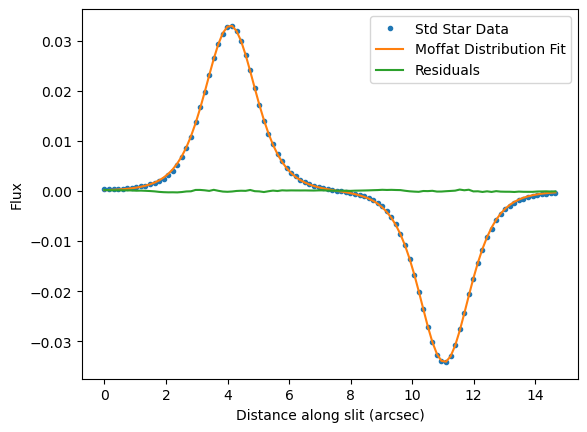

FWHM A beam: 1.9553642750594014
FWHM B beam: 1.9192705287425753


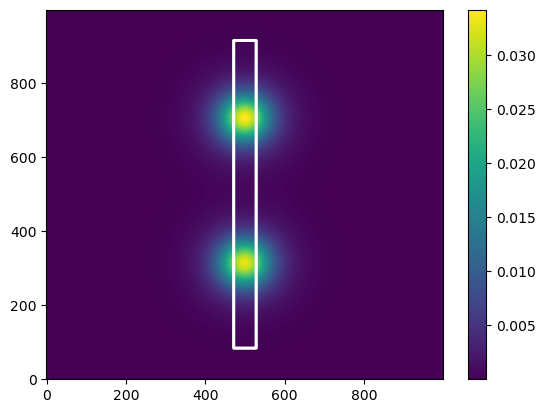

Estimated slit throughput = 0.384957504448917


In [9]:
from muler.utilities import Slit

slit = Slit(length=14.8, width=1, PA=90.0, guiding_error=1.0, n_axis=1000)

slit.ABBA(y=y, print_info=True, plot=True)

slit.plot2d()

estimated_slit_throughput = slit.estimate_slit_throughput()
print('Estimated slit throughput = ' + str(estimated_slit_throughput))

The above slit throughput estimate is for a single slice of a single order, but we want to know what the wavelength dependent slit throughput is so we do the same calculation for each order.  Now we set up arrays to store the slit throughput estimate and wavelength for each order.

    The maximum number of function evaluations is exceeded. [astropy.modeling.fitting]


Text(2.1, 0.4, 'K-band')

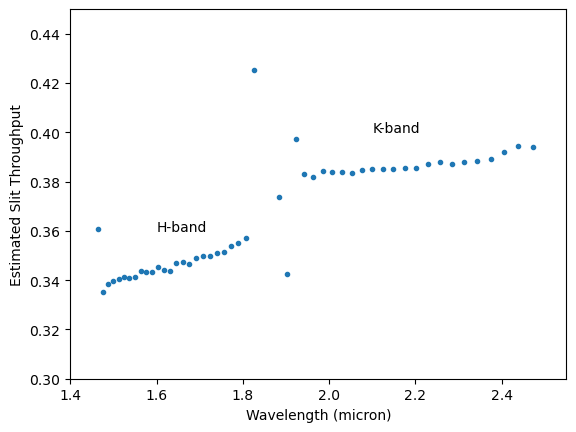

In [10]:
n_orders = len(norm_std_2D_spec)
estimated_slit_throughputs =  np.zeros(n_orders)
waves = np.zeros(n_orders)
x1 = 1200
x2 = 1300

for order in range(n_orders):
    y = np.nanmedian(norm_std_2D_spec[order].flux[:,x1:x2], axis=1)
    if ~np.all(np.isnan(y)):
        y[np.isnan(y)]=0.
        slit.clear()
        slit.ABBA(y=y, print_info=False)
        estimated_slit_throughputs[order] = slit.estimate_slit_throughput()
        waves[order] = np.nanmedian(norm_std_2D_spec[order].spectral_axis[x1:x2].value) * 1e-4 #Convert Angstroms to microns

plt.plot(waves, estimated_slit_throughputs, '.')
plt.xlim([1.4,2.55])
plt.ylim([0.3,0.45])
plt.xlabel('Wavelength (micron)')
plt.ylabel('Estimated Slit Throughput')
plt.text(1.6, 0.36, 'H-band')
plt.text(2.1, 0.40, 'K-band')

m = -0.0853436213764167
b = 0.42495292098549936


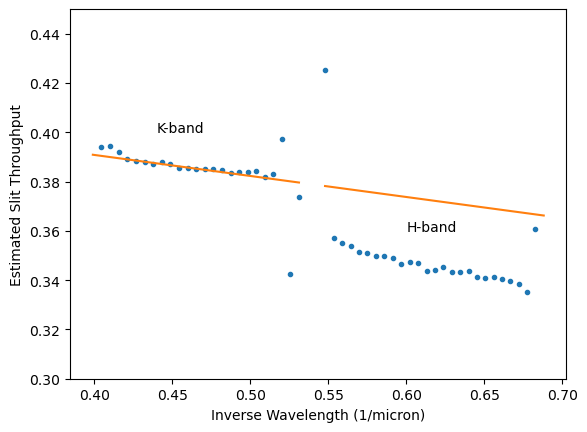

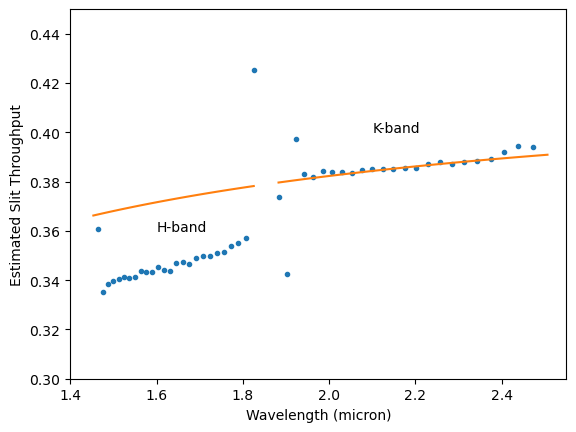

In [11]:
plt.figure()

plt.plot(1/(waves), estimated_slit_throughputs, '.')
#plt.xlim([1.4,2.55])
plt.ylim([0.3,0.45])
plt.xlabel('Inverse Wavelength (1/micron)')
plt.ylabel('Estimated Slit Throughput')

plt.text(0.60, 0.36, 'H-band')
plt.text(0.44, 0.40, 'K-band')

from astropy.modeling import models, fitting

wave_min = 2.1
wave_max = 2.4
init_line = models.Linear1D()
fitter = fitting.LinearLSQFitter()

i = (waves >= wave_min) & (waves <= wave_max)
fitted_line = fitter(init_line, 1/waves[i], estimated_slit_throughputs[i])

plt.plot(1/waves, fitted_line(1/waves))

plt.figure()

plt.plot(waves, estimated_slit_throughputs, '.')
plt.plot(waves, fitted_line(1/waves))
plt.xlim([1.4,2.55])
plt.ylim([0.3,0.45])
plt.xlabel('Wavelength (micron)')
plt.ylabel('Estimated Slit Throughput')
plt.text(1.6, 0.36, 'H-band')
plt.text(2.1, 0.40, 'K-band')

print('m =', fitted_line.slope.value)
print('b =', fitted_line.intercept.value)

Now that we have walked through all the steps for determining the slit throughput, we will use muler's built in method `getSlitThroughput` to automatically go through this entire process for the standard star.

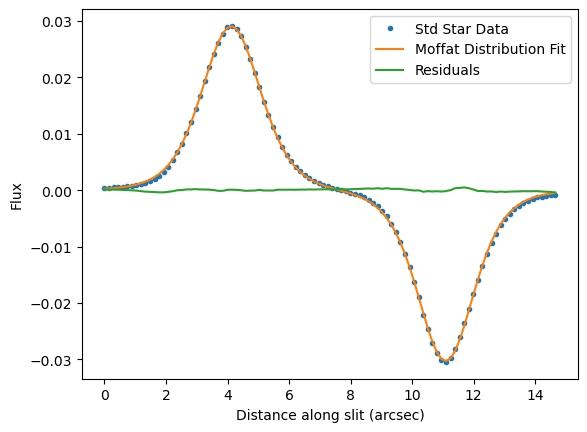

FWHM A beam: 2.2765249109087153
FWHM B beam: 2.1724590234795196
2D plot


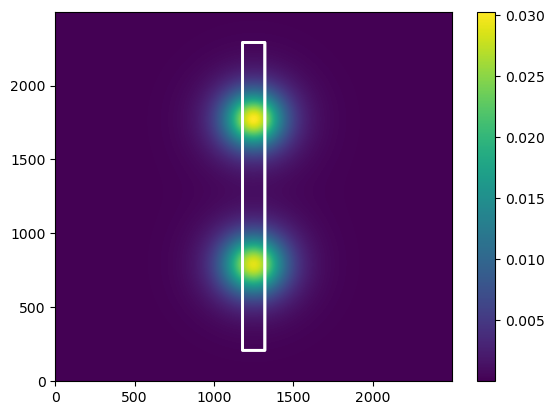

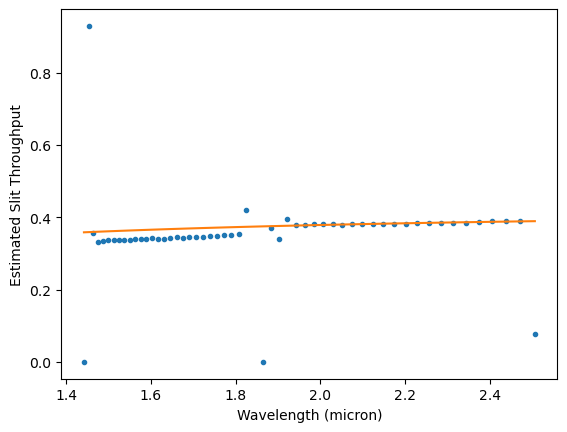

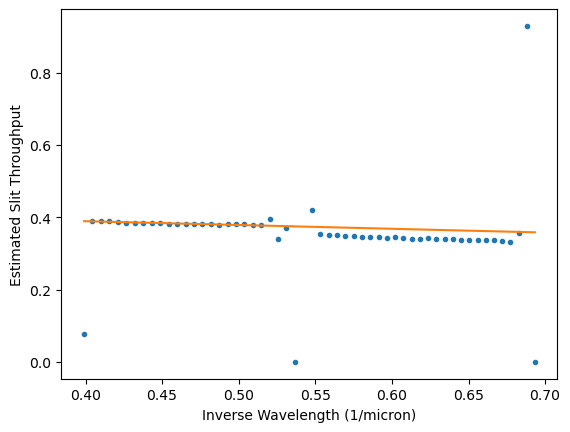

In [12]:
std_slit_throughput = std_spec.getSlitThroughput(slit_length=14.8, PA=90, guiding_error=1.0, col1=1200, col2=1300,
                           wave_min=2.0, wave_max=2.5, plot=True)

Since our science target AU Aur is also a star, we must also estimate how much of its own light goes through the slit in order to get a good flux calibration.

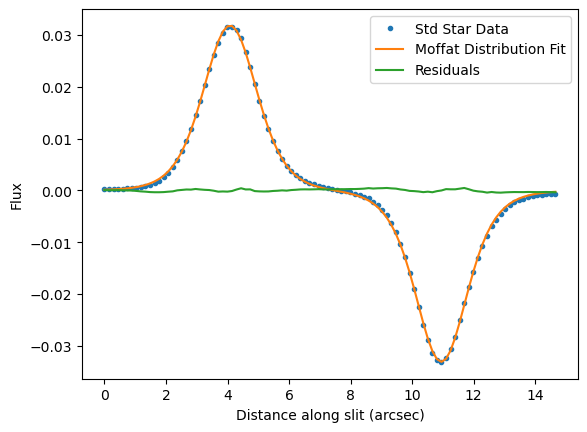

FWHM A beam: 2.0643178368889923
FWHM B beam: 1.9956610853277597
2D plot


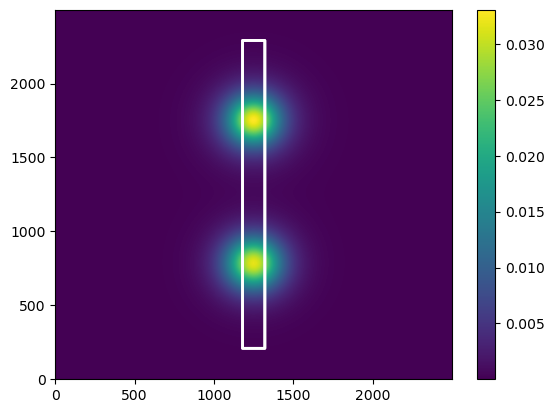

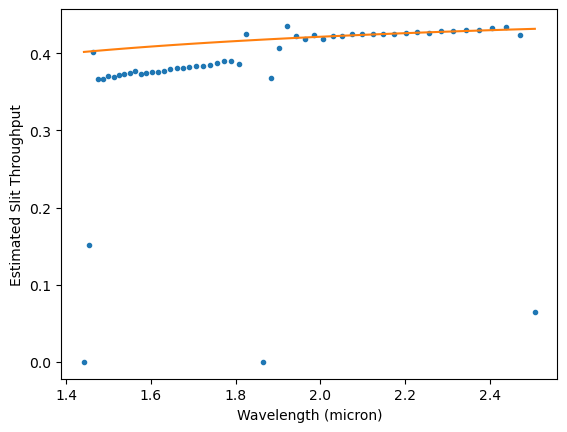

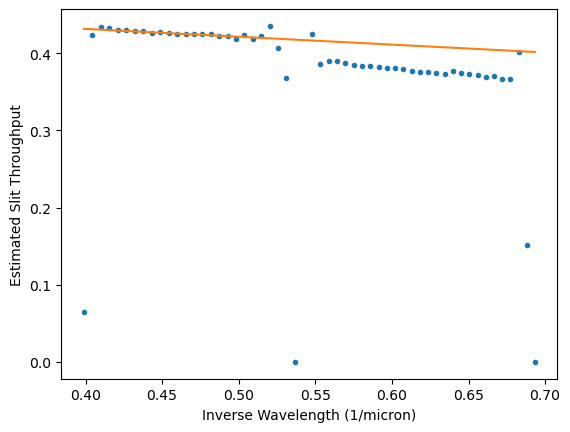

In [14]:
sci_slit_throughput = sci_spec.getSlitThroughput(slit_length=14.8, guiding_error=1.0, col1=1200, col2=1300,
                           wave_min=2.0, wave_max=2.5, plot=True)

Now let us plot the slit throughput for both the standard and science target stars.  As you can see the  HR 1237 is a fraction of 0.04 lower than SU Aur, presumeably due to slightly worse seeing.  It is likey the seeing was highly variable since it was windy during the observations.  The shape of each curve is almost the same, as expected. The throughput incresases at higher wavelengths since the seeing improves.

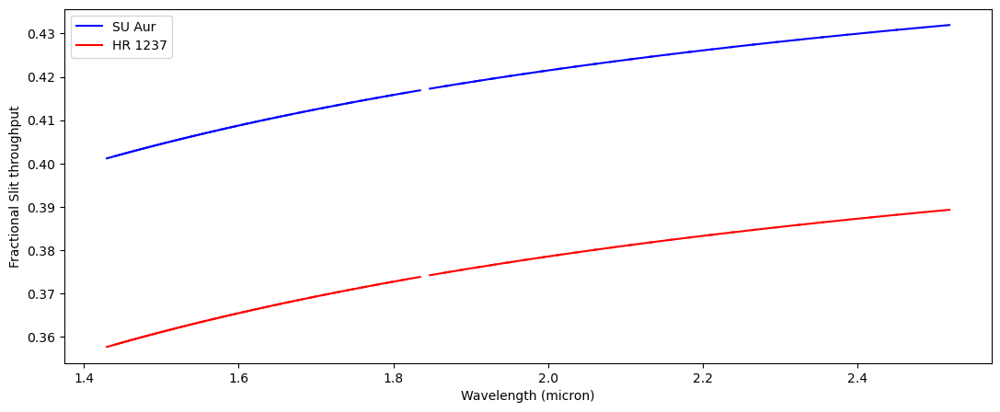

In [27]:
plt.figure(figsize=[13, 5])


plt.plot(sci_spec[0].spectral_axis.micron, sci_slit_throughput[0], color='blue', label='SU Aur')
for i in range(1, len(sci_spec)):
    plt.plot(sci_spec[i].spectral_axis.micron, sci_slit_throughput[i], color='blue')
    

plt.plot(std_spec[0].spectral_axis.micron, std_slit_throughput[0], color='red', label='HR 1237')
for i in range(1, len(std_spec)):
    plt.plot(std_spec[i].spectral_axis.micron, std_slit_throughput[i], color='red')

plt.xlabel('Wavelength (micron)')
plt.ylabel('Fractional Slit throughput')
plt.legend()

Now that we have estimated the throughput for each star.  We read in Pheonix stellar atmosphere model synthetic spectra and the `gollum` package to try to best match the spectrum and photometery for HR 1237.   

First let us set the parameters and read in a Pheonix stellar atmosphere model for what we think is a "Standard" A0V star from Gollum.  Set `path_to_pheonix_models` to where you want to or are storing your pheonix models.  We have set `download=True` so even if you haven't downloaded any models, gollum will download them for you.  This is very convenient!

<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:34: SyntaxWarning: invalid escape sequence '\m'
/var/folders/2z/5xcysgs90rg6vpnkbv24c238bwqnlv/T/ipykernel_96620/580260944.py:34: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Wavelength ($\mu$m)')


Text(0, 0.5, 'Relative Flux')

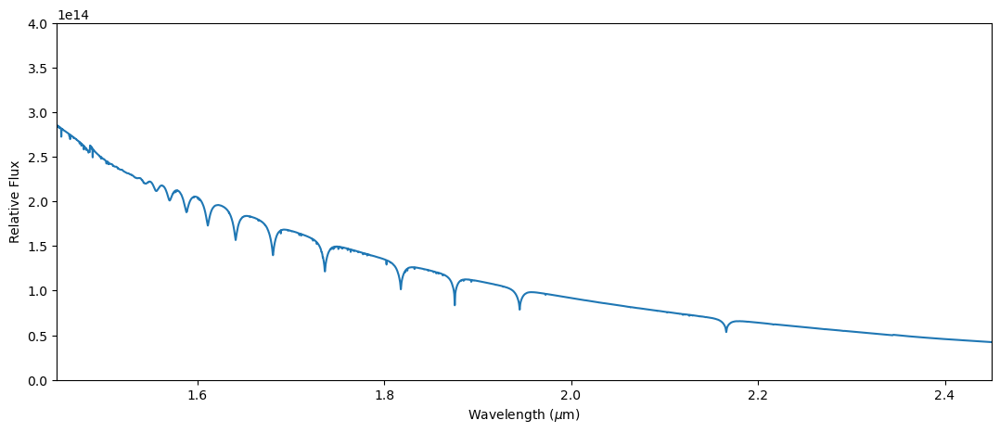

In [18]:
from gollum.phoenix import PHOENIXSpectrum #Gollum: https://gollum-astro.readthedocs.io/en/latest/
from dust_extinction.averages import GCC09_MWAvg #Dust_extinction: https://dust-extinction.readthedocs.io/en/latest/index.html#
extinction_model = GCC09_MWAvg() #Dust extinction model: https://dust-extinction.readthedocs.io/en/latest/api/dust_extinction.averages.G21_MWAvg.html#dust_extinction.averages.G21_MWAvg

path_to_pheonix_models = '../../../../Box/phoenix_standard_star_models/'

#Star parameters
teff = 9800 #Effective temperature in K
logg = 4.5 #Surface gravity in log10(g)
z = 0.0 #Metallicity in log10 solar units
rv = 20.0 #Radial velocity in km/s
vsini = 35.0 #Rotational velocity in v*sin(i) km/s
Ebv = 0.00 #Galactic reddening

#IGRINS parameters
resolving_power = 45000.0

#Synthetic spectrum parameters
min_wavelength = 1e3 #Minimum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the B band
max_wavelength = 3e4  #Maximum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the end of the K band


#Read in and plot synthetic spectrum
synth_spec = PHOENIXSpectrum(teff=teff, logg=logg, path=path_to_pheonix_models, wl_lo=min_wavelength, wl_hi=max_wavelength, download=True)
synth_spec = synth_spec.rv_shift(rv)
synth_spec = synth_spec.rotationally_broaden(vsini) #apply rotational broadening
synth_spec =  synth_spec * extinction_model.extinguish(synth_spec.spectral_axis, Ebv=Ebv) #Apply galactic extinction


plt.figure(figsize=[13, 5])
plt.plot(synth_spec.spectral_axis.micron, synth_spec.flux)
plt.xlim([1.45,2.45])
plt.ylim([0, 4e14])
plt.xlabel('Wavelength ($\mu$m)')
plt.ylabel('Relative Flux')

Above you can see what the synthetic spectrum looks like over the H & K bands.  The continuum is mostly featureless as the weak narrow metal lines get "smeared out" at even low rotational velocities.  The main constituant is the broad H I lines.

We will iterate on the stellar parameters in the Pheonix model grid until we get the best fit.  Currently this is done "by eye" but in the future might be automated by some sort of machine learning algorithim.

First this is the Photometry for HR 1237 from Simbad:

B 6.352 [0.014] D 2000A&A...355L..27H<br>
V 6.305 [0.010] D 2000A&A...355L..27H<br>
G 6.292517 [0.002777] C 2020yCat.1350....0G<br>
J 6.064 [0.023] C 2003yCat.2246....0C<br>
H 6.090 [0.020] C 2003yCat.2246....0C<br>
K 6.074 [0.020] C 2003yCat.2246....0C<br>

For an A0V star, we expect of the magnitudes to be about the same for all bands since Vega is the "gold standard" A0V star and our photometric system works (mostly) by assuming Vega is magnitude 0 for every band.  HR 1237 appears to be a little redder, which can be caused by it either being cooler than Vega, Galactic dust extinction, or some combination of both.

We scale the synthetic spectrum to match the V band magnitude of HR 1237.  To check how well the synethic stellar spectrum matches the photometry of HD 34317, we do synthetic photometry on the synthetic spectrum using the package `tynt` (https://github.com/bmorris3/tynt).  This is all built into the muler class `photometry`.

In [19]:
from muler.utilities import photometry
p = photometry()

In [21]:
scaled_synth_spec = p.scale(synth_spec, mag=6.305, band='V')
print('B band = ', p.get(scaled_synth_spec, band='B'))
print('V band = ', p.get(scaled_synth_spec, band='V'))
# print('R band = ', p.get(scaled_synth_spec, band='R'))
# print('I band = ', p.get(scaled_synth_spec, band='I'))
print('J band = ', p.get(scaled_synth_spec, band='J'))
print('H band = ', p.get(scaled_synth_spec, band='H'))
print('K band = ', p.get(scaled_synth_spec, band='K'))

B band =  6.336570086673033
V band =  6.305000000000001
J band =  6.304966145341253
H band =  6.314555614638252
K band =  6.3133362092257155


Right away we can see that the synthetic photomery for the Phoenix model is too blue for HR 1237.   We will need to redden the synthetic spectrum.  The Gaia G band magnitude reported in Simbad of 6.292 almost always matches the V band magnitude (here 6.305).  Mismatches are a sign the star might be variable.  Since the G and V band magnitudes were taken almost 20 years apart but give almost the same result, HR 1237 likely isn't variable, so the 2MASS J, H, and K magnitudes likely are real.  The spectral type estimates of A0V are old, so this might be a cooler star than initially expected.  Standard stars are typically nearby so are little affected by interstellar dust.  Instead we will read in a cooler model and try again to see how well the photometry matches. We also lower the log(g) to make the B magnitude better match.  Indeed other spectral type estimates give HR 1237 as a sub-giant which would have lower log(g).

In [94]:
#Star parameters
teff = 8600 #Effective temperature in K
logg = 3.5 #Surface gravity in log10(g)
z = 0.0 #Metallicity in log10 solar units
rv = 20.0 #Radial velocity in km/s
vsini = 35.0 #Rotational velocity in v*sin(i) km/s
Ebv = 0.00 #Galactic reddening

#IGRINS parameters
resolving_power = 45000.0

#Synthetic spectrum parameters
min_wavelength = 1e3 #Minimum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the B band
max_wavelength = 3e4  #Maximum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the end of the K band


#Read in and plot synthetic spectrum
synth_spec = PHOENIXSpectrum(teff=teff, logg=logg, path=path_to_pheonix_models, wl_lo=min_wavelength, wl_hi=max_wavelength, download=True)
synth_spec = synth_spec.rv_shift(rv)
synth_spec = synth_spec.rotationally_broaden(vsini) #apply rotational broadening
synth_spec =  synth_spec * extinction_model.extinguish(synth_spec.spectral_axis, Ebv=Ebv) #Apply galactic extinction

In [95]:
scaled_synth_spec = p.scale(synth_spec, mag=6.305, band='V')
print('B band = ', p.get(scaled_synth_spec, band='B'))
print('V band = ', p.get(scaled_synth_spec, band='V'))
# print('R band = ', p.get(scaled_synth_spec, band='R'))
# print('I band = ', p.get(scaled_synth_spec, band='I'))
print('J band = ', p.get(scaled_synth_spec, band='J'))
print('H band = ', p.get(scaled_synth_spec, band='H'))
print('K band = ', p.get(scaled_synth_spec, band='K'))

B band =  6.38997709694305
V band =  6.305000000000001
J band =  6.101168984399896
H band =  6.066140043829668
K band =  6.053874517081405


You can now see we are much closer to matching the photometry for HR 1237, but the Pheonix model grid is coarse.  In order to get a better match, we going to average two Phoenix models.  This is essentially a simple way of interpolating the model grid.

In [ ]:
#IGRINS parameters
resolving_power = 45000.0
min_wavelength = 1e3 #Minimum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the B band
max_wavelength = 3e4  #Maximum wavelength for synthetic stellar spectrum in angstroms, we want this to go all the way to the end of the K band

#Parameters both synthetic spectra will share
z = 0.0 #Metallicity in log10 solar units
rv = 20.0 #Radial velocity in km/s
vsini = 35.0 #Rotational velocity in v*sin(i) km/s
Ebv = 0.00 #Galactic reddening

#Parameters and loading of synethic spectrum 1
teff = 8400 #Effective temperature in K
logg = 3.5 #Surface gravity in log10(g)
synth_spec_1 = PHOENIXSpectrum(teff=teff, logg=logg, path=path_to_pheonix_models, wl_lo=min_wavelength, wl_hi=max_wavelength, download=True)

#Parameters and loading of synethic spectrum 2
teff = 8600 #Effective temperature in K
logg = 4.0 #Surface gravity in log10(g)
synth_spec_2 = PHOENIXSpectrum(teff=teff, logg=logg, path=path_to_pheonix_models, wl_lo=min_wavelength, wl_hi=max_wavelength, download=True)




In [163]:
#Test dividing by synthetic spectrum
from muler.utilities import resample_list
HD29526_corrected = HD29526 / resample_list(scaled_synth_spec, HD29526)

Text(0.5, 1.0, 'HD 29526 Unprocessed')

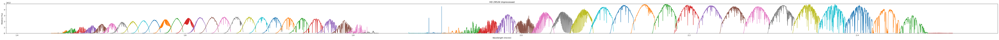

In [164]:
#Plot whole "corrected" spectrum

plt.figure(figsize=[100, 3])
for order in HD29526_corrected:
    plt.plot(order.spectral_axis.micron, order.flux)
plt.ylim([0, 5e12])
plt.xlabel('Wavelength (micron)')
plt.ylabel('Relative Flux')
plt.title('HD 29526 Unprocessed')


(0.0, 5000000000000.0)

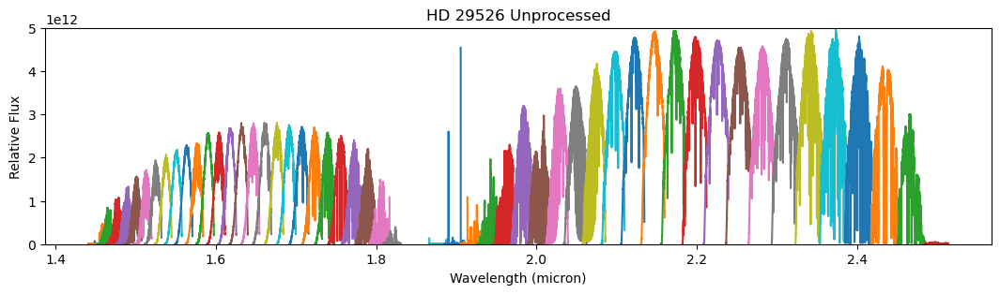

In [165]:
#Zoom in on Br-Gamma

plt.figure(figsize=[13, 3])
for order in HD29526_corrected:
    plt.plot(order.spectral_axis.micron, order.flux)

plt.xlabel('Wavelength (micron)')
plt.ylabel('Relative Flux')
plt.title('HD 29526 Unprocessed')

plt.ylim([0, 5e12])
#plt.xlim([2.15, 2.175])

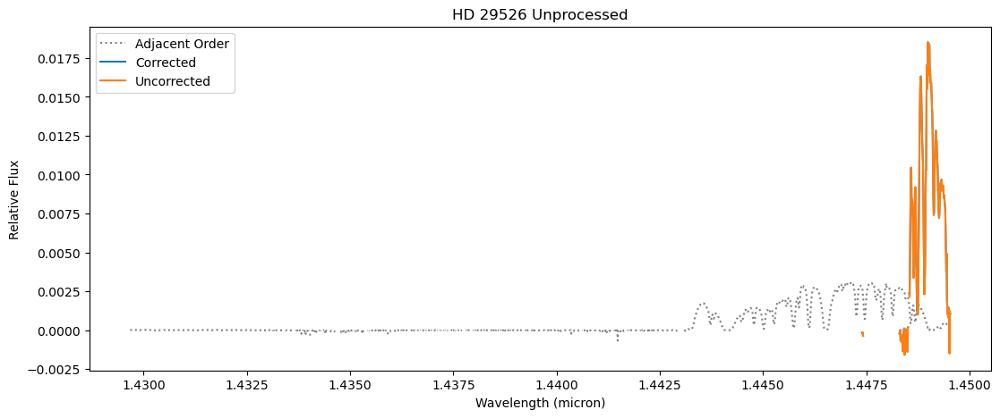

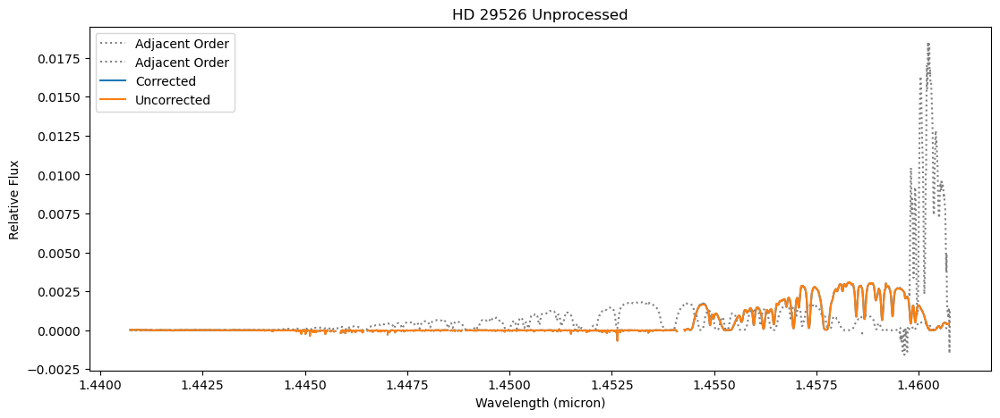

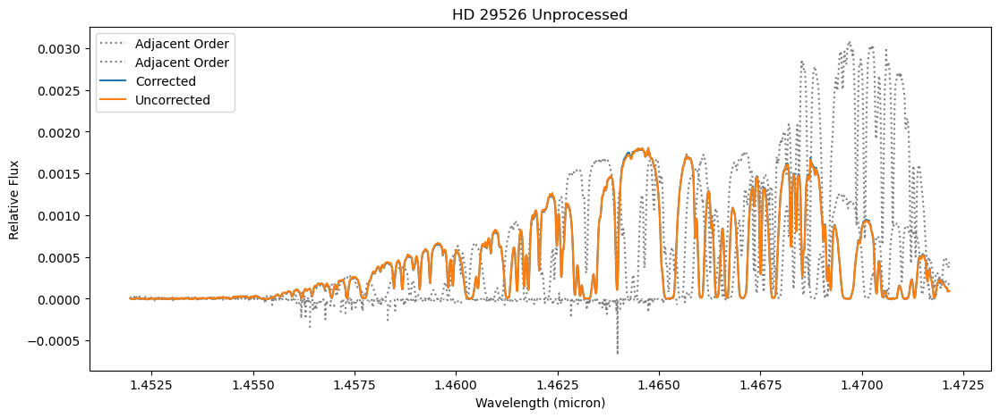

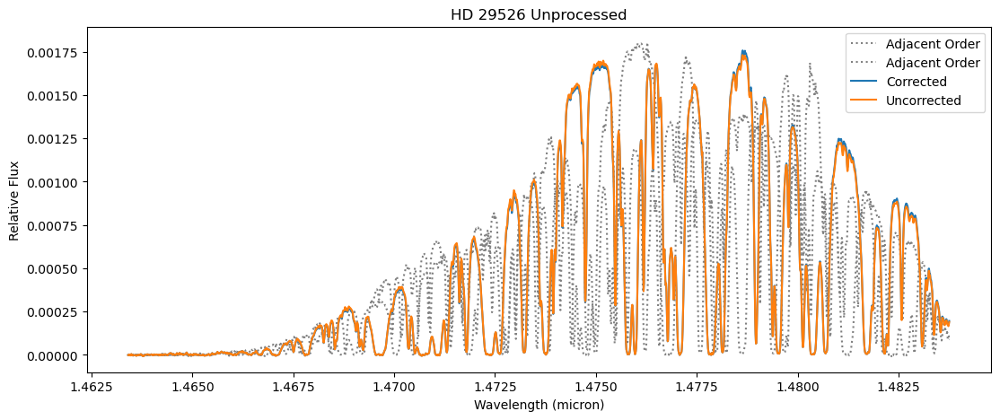

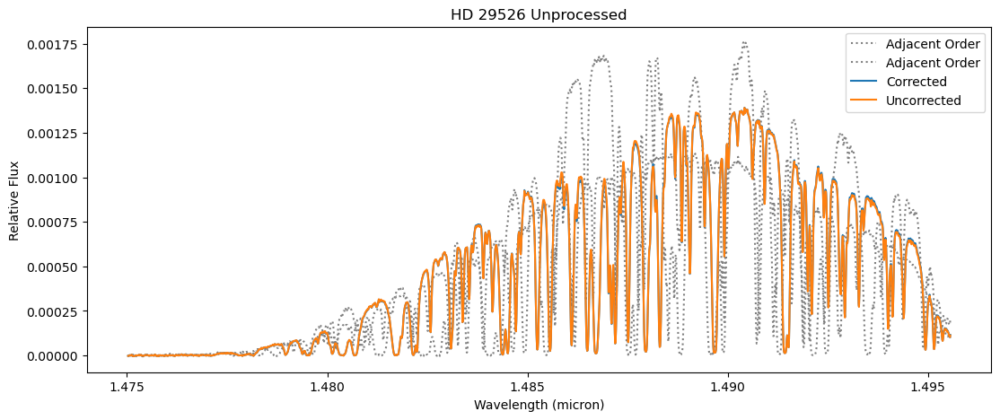

...

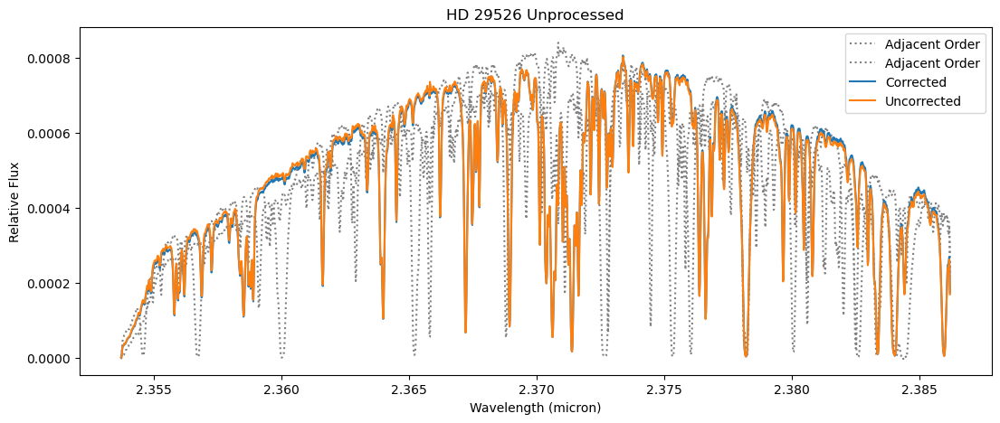

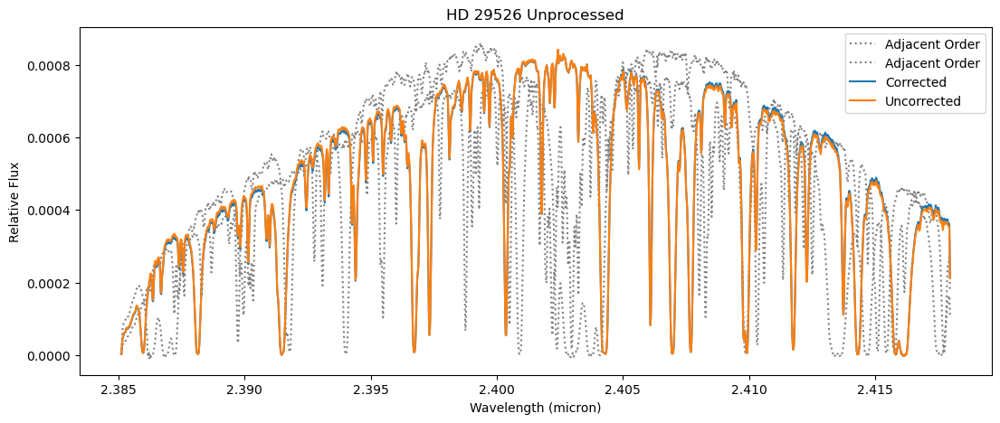

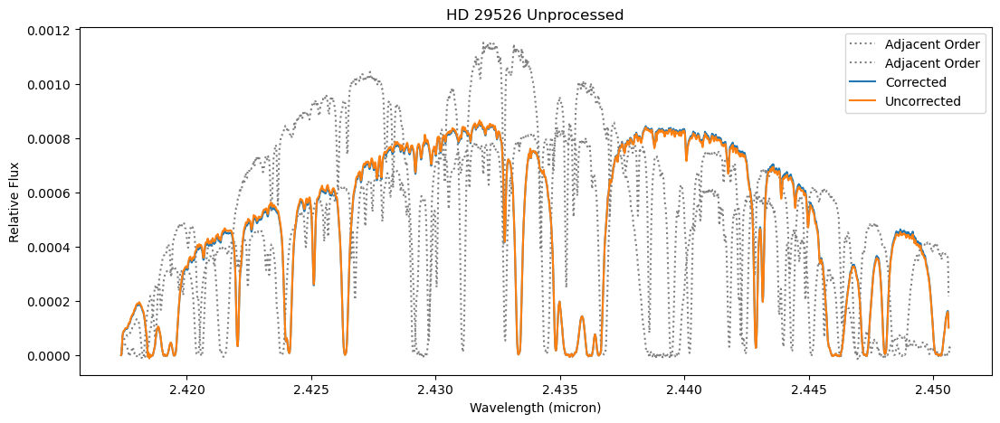

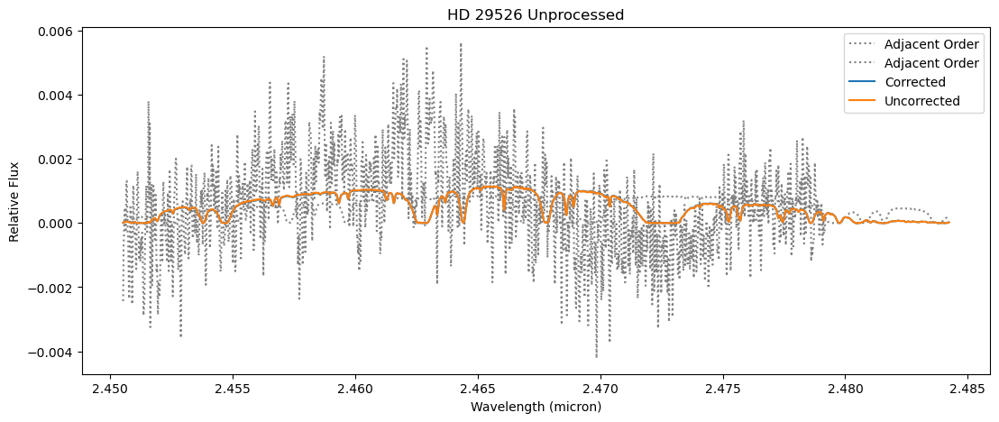

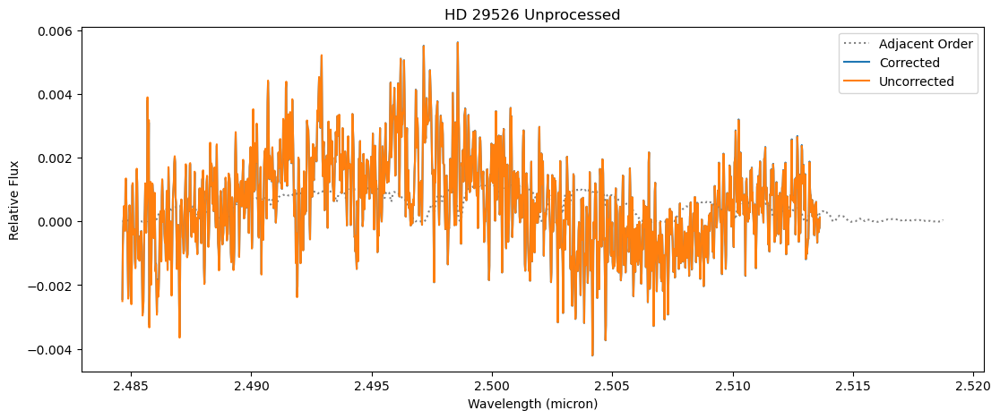

In [170]:
#Plot each order normalized and uncorrected and corrected for a direct comparison

for i in range(len(HD29526)):
    # deviation = (HD29526_corrected[i].flux / np.nansum(HD29526_corrected[i].flux)) / (HD29526[i].flux / np.nansum(HD29526[i].flux))
    # if np.sum(  np.abs(np.abs(deviation) - 1.0) > 0.05) > 40:
    if True:
        plt.figure(figsize=[13, 5])
        if i > 0:
            plt.plot(HD29526[i].spectral_axis.micron, HD29526_corrected[i-1].flux / np.nansum(HD29526_corrected[i-1].flux), ':', color='gray', label='Adjacent Order')
        if i < len(HD29526)-1:
            plt.plot(HD29526[i].spectral_axis.micron, HD29526_corrected[i+1].flux / np.nansum(HD29526_corrected[i+1].flux), ':', color='gray', label='Adjacent Order')
                
        
        plt.plot(HD29526_corrected[i].spectral_axis.micron, HD29526_corrected[i].flux / np.nansum(HD29526_corrected[i].flux), label='Corrected')
        plt.plot(HD29526[i].spectral_axis.micron, HD29526[i].flux / np.nansum(HD29526[i].flux), label='Uncorrected')
    
    
        plt.legend()
        plt.xlabel('Wavelength (micron)')
        plt.ylabel('Relative Flux')
        plt.title('HD 29526 Unprocessed')


Next we want to get an idea of what the H I line profiles look like for HD 34317.  We will deblaze the spectrum and plot some of the H I lines in regions of the spectrum away from major telluric absorption.

In [125]:
from muler.utilities import combine_spectra_misaligned

#deblazed_HD34317 = HD34317#.remove_nans().trim_edges([300,1950])#.flatten(window_length=601, polyorder=3, break_tolerance=51)
#deblazed_HD34317 = HD34317.trim_overlap().flatten(window_length=501, polyorder=3, break_tolerance=51).stitch()
# deblazed_HD34317 = HD34317.flatten(window_length=601, polyorder=3, break_tolerance=51).trim_overlap().stitch()

In [126]:
plt.plot(deblazed_HD34317.spectral_axis.micron, deblazed_HD34317.flux.value)
plt.xlim([1.576, 1.579])
plt.ylim([0, 1.2])

NameError: name 'deblazed_HD34317' is not defined

In [ ]:
#for i in range(0, len(deblazed_HD34317)):
#    plt.plot(deblazed_HD34317[i].spectral_axis.micron, deblazed_HD34317[i].flux.value)
plt.plot(deblazed_HD34317.spectral_axis.micron, deblazed_HD34317.flux.value)
plt.xlim([2.160, 2.172])
plt.ylim([0, 1.2])

In [ ]:
# plt.figure(figsize=[13, 5])
#for i in range(0, len(deblazed_HD34317)):
#    plt.plot(deblazed_HD34317[i].spectral_axis.micron, deblazed_HD34317[i].flux.value)
plt.plot(deblazed_HD34317.spectral_axis.micron, deblazed_HD34317.flux.value)
plt.xlim([2.161, 2.172])
plt.ylim([0.55, 1.2])

In [ ]:
plt.figure(figsize=[13, 5])
for i in range(0, len(HD34317)):
    plt.plot(HD34317[i].spectral_axis.micron, HD34317[i].flux.value)
#plt.plot(deblazed_HD34317[11].spectral_axis.micron, deblazed_HD34317[11].flux.value)
plt.xlim([1.56, 1.58])
plt.ylim([0, 2e4])

In [ ]:
thing = deblazed_HD34317[i]

In [ ]:
thing.meta["m"]

In [ ]:
pdb